In [8]:
import pandas as pd
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import os
#import cartopy.crs as ccrs
#import cartopy.feature as cfeature

In [9]:
def get_fpaths_from_dir(dirpath):
    fpaths = []
    for root, dirs, files in os.walk(dirpath):
            for name in files:
                fpath = os.path.join(root, name)
                fpaths.append(fpath)
    return fpaths

## Brazil ~ Sound Recorder

For Brazil files you will find 4 different nomenclatures for the data that follow the following pattern:

"ds_spectrogram_[category]_[date]T[time]_[section].nc"

We have the following categories :

- 'dry' certified no rain time steps 
- 'no_class' unknown if it rains or not steps
- 'noisy_rain' steps where we have rain but also other noisy sounds
- 'rain' most clearly rain timesteps

The [section] part for the filenames relates to the fact that we split the spectrograms time-wise in order to have 6 different files per minute-t-step (A-to-F).

The date is in format YYYYMMDD and time HHMMSS

In [10]:
fpaths_brazil = get_fpaths_from_dir('data/brazil/')

In [11]:
fpaths_brazil_nc = [fpath for fpath in fpaths_brazil if '.nc' in fpath]

In [5]:
# Let's separate the fpaths by category

categories = ['dry',
              'no_class',
              'noisy_rain',
              'rain']

str_to_match = {'dry': 'dry',
                'no_class': 'no_class',
                'noisy_rain': 'noisy_rain',
                'rain': 'm_rain'}

fpaths_by_cat = {cat: [fp for fp in fpaths_brazil_nc if str_to_match[cat] in fp] for cat in categories}

Etude des textures issues des images des spectrogrammes.

Question : les textures sont-elles suffisantes pour discriminer les 4 catégories ?

In [12]:
import numpy as np
from skimage.feature import greycomatrix, greycoprops

def computeTextureFeatures(spectrogram):
    # Normalisez le spectrogramme dans l'intervalle [0, 255] (utile pour les matrices de co-occurrence)
    spectrogram = (spectrogram - np.min(spectrogram)) / (np.max(spectrogram) - np.min(spectrogram)) * 255

    # Convertir le spectrogramme en entiers (valeurs d'intensité d'image)
    spectrogram = spectrogram.astype(np.uint8)
    # Paramètres pour la matrice de co-occurrence
    distance = 1
    angles = [0, np.pi/4, np.pi/2, 3*np.pi/4]  # Quatre angles pour capturer les dépendances directionnelles

    # Calcul de la matrice de co-occurrence
    glcm = greycomatrix(spectrogram, [distance], angles, symmetric=True, normed=True)

    # Caractéristiques de texture extraites à partir de la matrice de co-occurrence
    contrast = greycoprops(glcm, 'contrast').ravel()
    dissimilarity = greycoprops(glcm, 'dissimilarity').ravel()
    homogeneity = greycoprops(glcm, 'homogeneity').ravel()
    energy = greycoprops(glcm, 'energy').ravel()
    correlation = greycoprops(glcm, 'correlation').ravel()

    # Concaténer les caractéristiques pour obtenir un vecteur de caractéristiques complet
    texture_features = np.hstack([contrast, dissimilarity, homogeneity, energy, correlation])

    return texture_features



In [77]:
# Créez un DataFrame vide pour stocker les caractéristiques de tous les spectrogrammes
features = pd.DataFrame()
label=[]
for categ in categories:
    for i in range(len(fpaths_by_cat[categ])):
    #for i in range(10):
        label.append(categ)
        fpath = fpaths_by_cat[categ][i]
        ds_spec = xr.open_dataset(fpath)
        data = ds_spec.spectrogram.data
        #Peut etre utiliser en echelle log.
        texture = computeTextureFeatures(data)      

        # Créez un DataFrame temporaire pour les caractéristiques de chaque spectrogramme
        spectrogram_df = pd.DataFrame([texture], columns=[f'Feature_{j+1}' for j in range(len(texture))] )
        spectrogram_df.columns=["contrast1","contrast2","contrast3","contrast4", "dissimilarity1","dissimilarity2", "dissimilarity3", "dissimilarity4", "homogeneity1","homogeneity2","homogeneity3","homogeneity4", "energy1", "energy2", "energy3", "energy4", "correlation1","correlation2","correlation3","correlation4"]

        # Ajoutez les caractéristiques du spectrogramme au DataFrame global
        features = pd.concat([features, spectrogram_df], ignore_index=True)

#ajout des categories de pluie
features['categ']=label
print(features.head())





C:\Users\ecail\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\skimage\feature\__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
C:\Users\ecail\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_version='1.0')
C:\Users\ecail\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\skimage\feature\__init__.py:42: skimage_deprecation: Function ``greycoprops`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycoprops`` instead.
  removed_ve

   contrast1  contrast2  contrast3  contrast4  dissimilarity1  dissimilarity2  \
0   3.329513   4.339287   4.161115   4.552286        0.154564        0.190926   
1   5.442787   7.765318   7.674319   7.964955        0.278512        0.345494   
2   4.981654   7.377416   7.462469   7.480230        0.287578        0.359747   
3   8.037098  11.057245  10.782512  10.834606        0.408684        0.496730   
4   5.597602   7.794627   7.809728   7.827008        0.326552        0.403469   

   dissimilarity3  dissimilarity4  homogeneity1  homogeneity2  ...  \
0        0.191673        0.194283      0.970950      0.967041  ...   
1        0.344647        0.350975      0.956829      0.951978  ...   
2        0.358894        0.358806      0.954006      0.948775  ...   
3        0.493625        0.497964      0.939945      0.933732  ...   
4        0.404798        0.405666      0.949780      0.944478  ...   

   homogeneity4   energy1   energy2   energy3   energy4  correlation1  \
0      0.966704  0.

<Figure size 800x600 with 0 Axes>

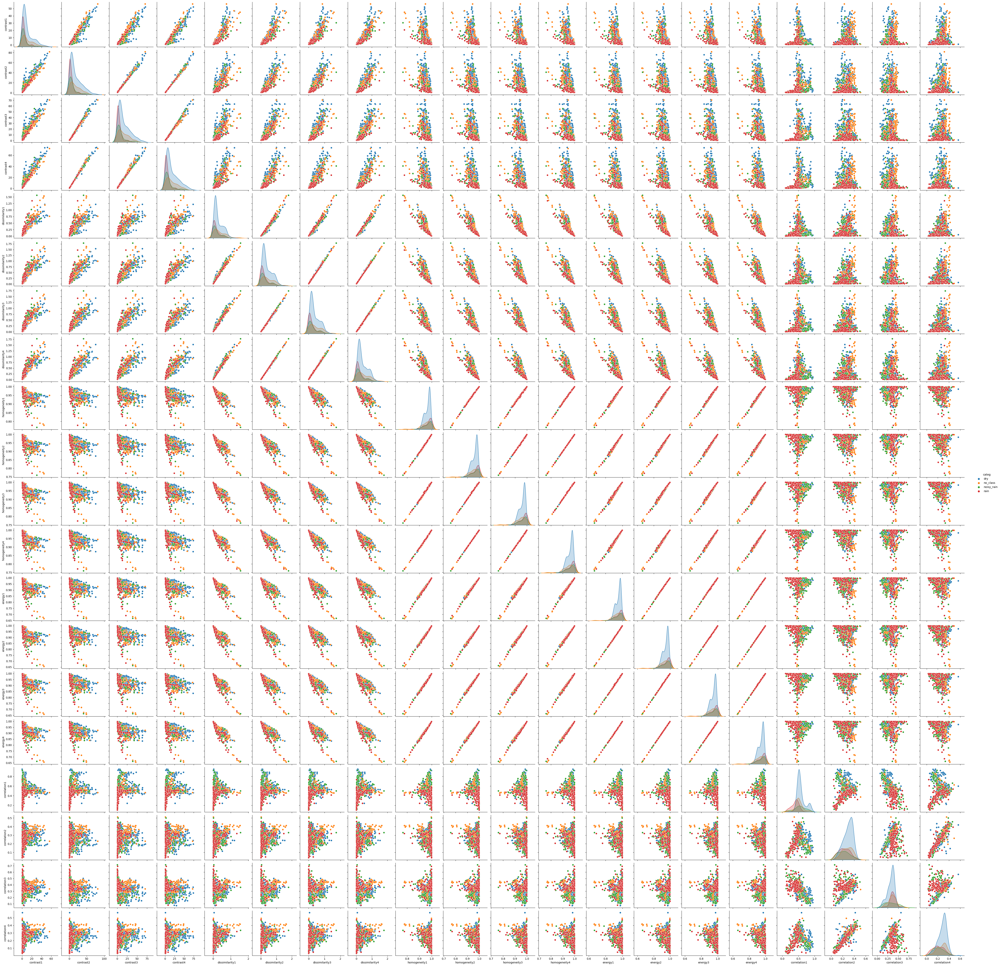

In [78]:
import seaborn as sns
corr_df = features.corr(method='pearson')

plt.figure(figsize=(8, 6))
sns.pairplot(features,hue="categ")
plt.show()

hdbscan
[[142  14 234]
 [ 64   6  80]
 [ 24   1  95]
 [ 10   5 135]]
Agglo
[[ 99 177  34  80]
 [ 42  60  12  36]
 [ 15  32   4  69]
 [ 12  41   1  96]]
RF APP
[[382   1   0   7]
 [122  10   1  17]
 [ 86   2  11  21]
 [ 74   3   3  70]]


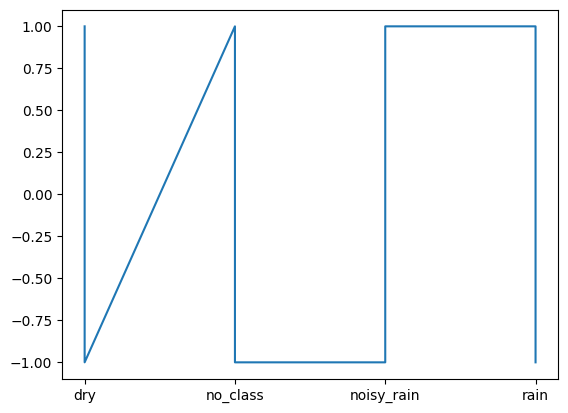

In [83]:
import hdbscan
from sklearn.cluster import AgglomerativeClustering
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics.cluster import contingency_matrix

#print(features.columns)
print("hdbscan")

data=features.drop(columns="categ")

clusterer = hdbscan.HDBSCAN(min_cluster_size=10)
cluster_labels = clusterer.fit_predict(data)
plt.plot(label, cluster_labels)
print(contingency_matrix(label,cluster_labels))

clusterer = AgglomerativeClustering(n_clusters=4)
cluster_labels = clusterer.fit_predict(data)

print("Agglo")

#plt.plot(label, cluster_labels)
print(contingency_matrix(label,cluster_labels))

clusterer = AgglomerativeClustering(n_clusters=4)
cluster_labels = clusterer.fit_predict(data)

classifier=RandomForestClassifier(max_depth=2, random_state=0)
classifier.fit(data,label)
pred_labels=classifier.predict(data)
#plt.plot(label, pred_labels)
print("RF APP")
print(contingency_matrix(label,pred_labels))



file path : data/brazil/sound_recorder\ds_spectrogram_dry_20230407T000000_A.nc
file path : data/brazil/sound_recorder\ds_spectrogram_dry_20230407T000000_B.nc
file path : data/brazil/sound_recorder\ds_spectrogram_dry_20230407T000000_C.nc
file path : data/brazil/sound_recorder\ds_spectrogram_dry_20230407T000000_D.nc
file path : data/brazil/sound_recorder\ds_spectrogram_dry_20230407T000000_E.nc
file path : data/brazil/sound_recorder\ds_spectrogram_dry_20230407T000000_F.nc
file path : data/brazil/sound_recorder\ds_spectrogram_dry_20230407T001100_A.nc
file path : data/brazil/sound_recorder\ds_spectrogram_dry_20230407T001100_B.nc
file path : data/brazil/sound_recorder\ds_spectrogram_dry_20230407T001100_C.nc
file path : data/brazil/sound_recorder\ds_spectrogram_dry_20230407T001100_D.nc


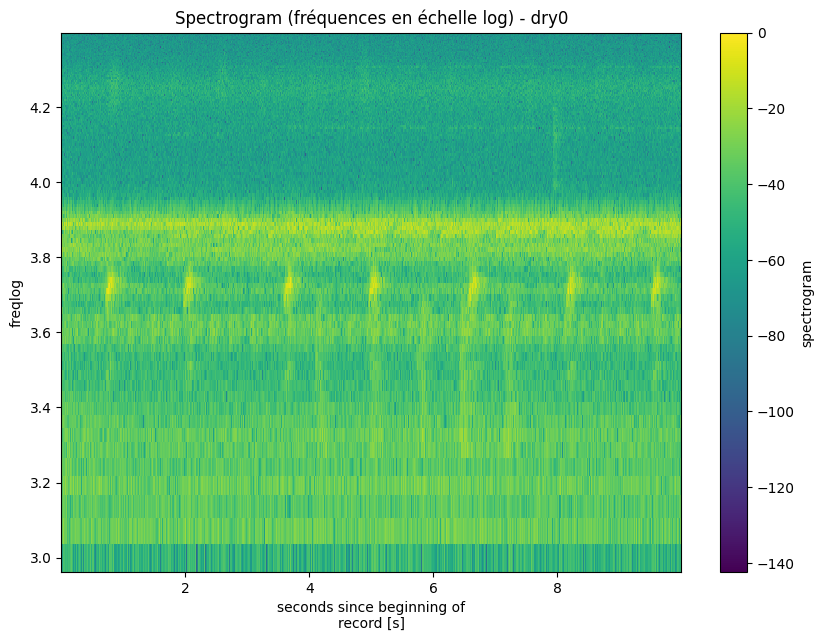

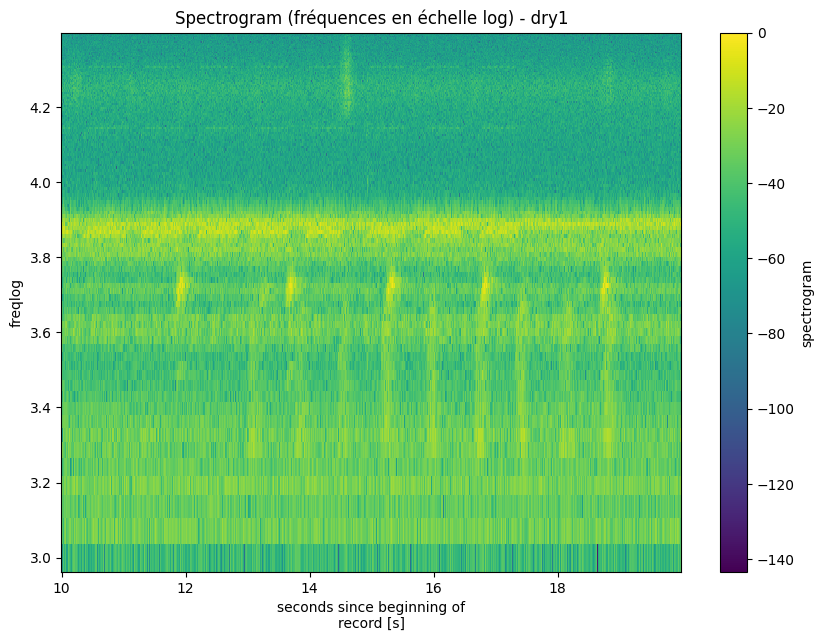

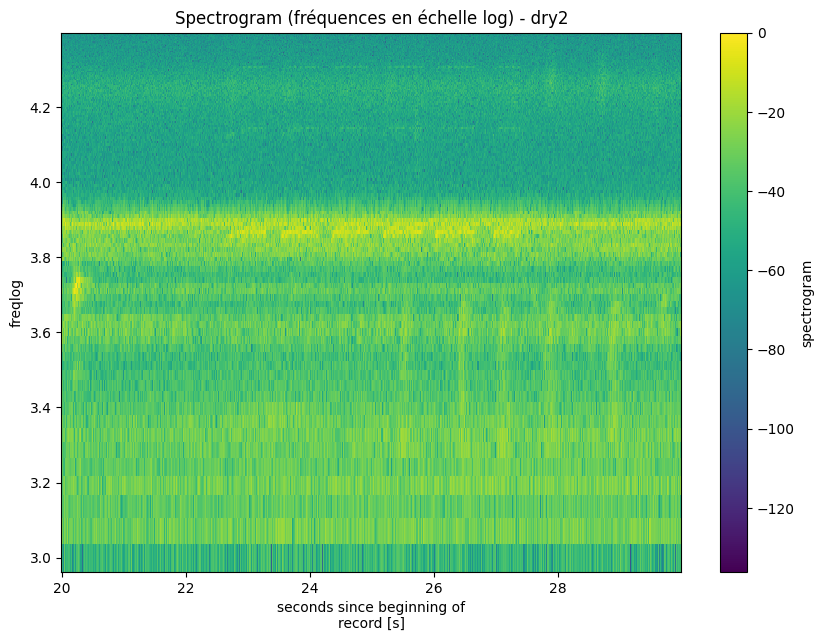

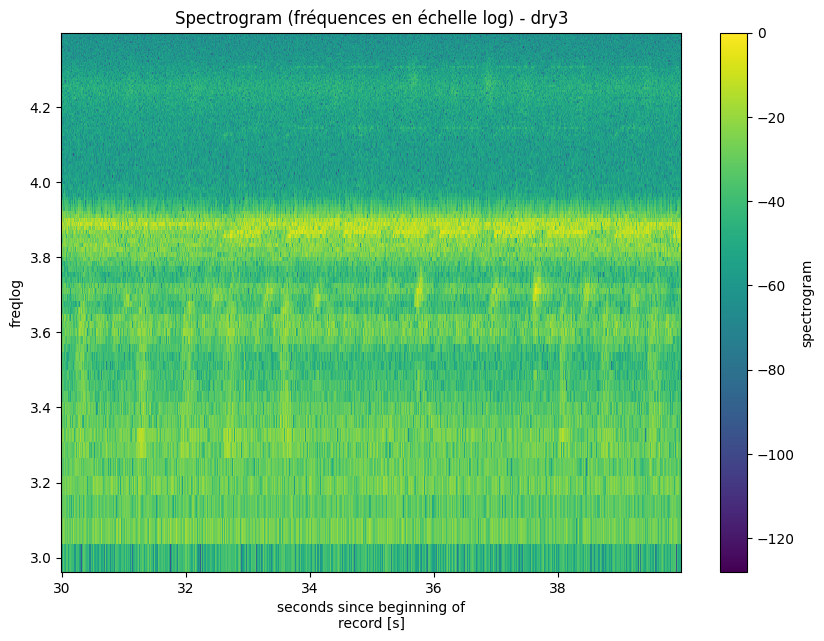

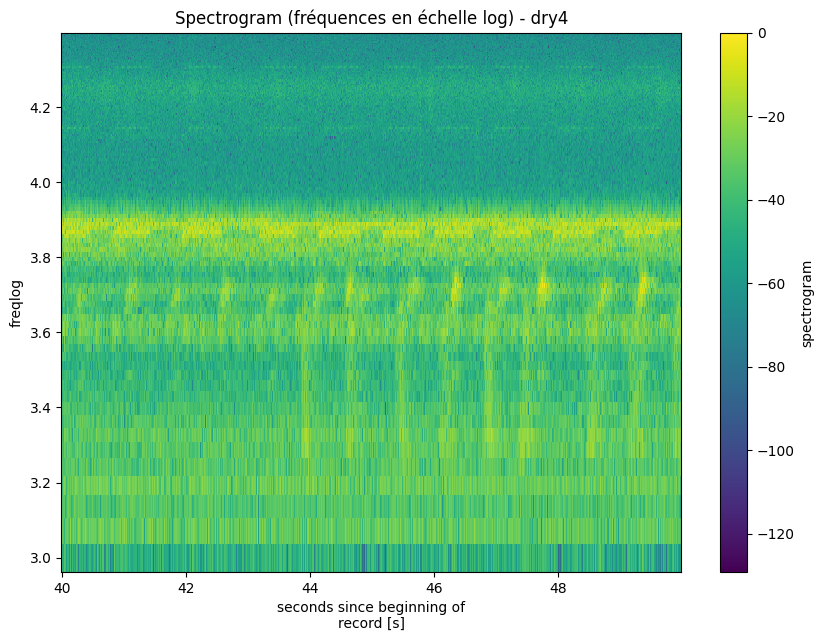

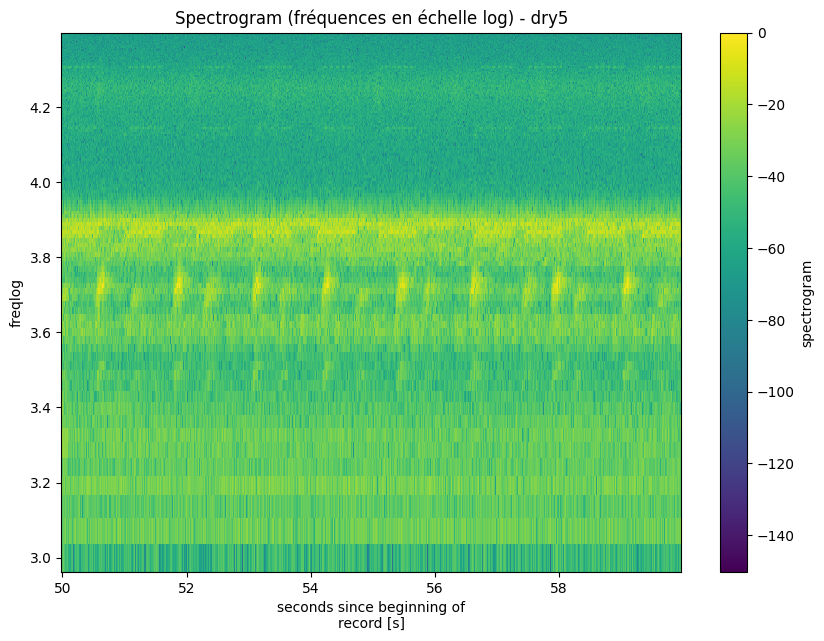

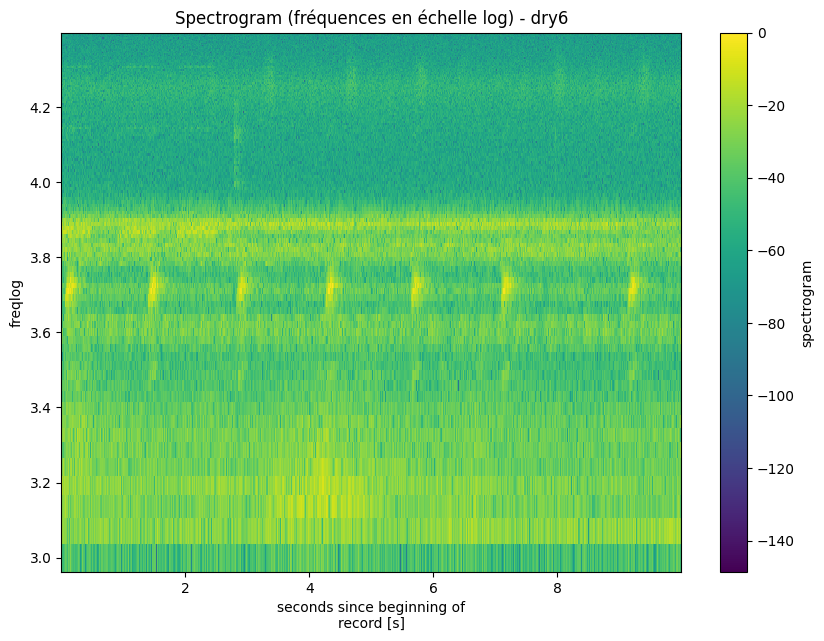

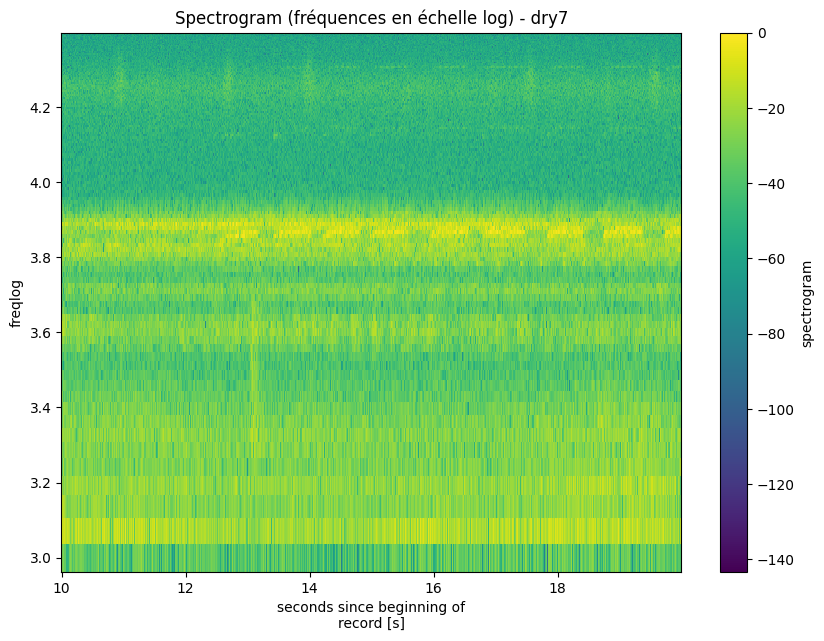

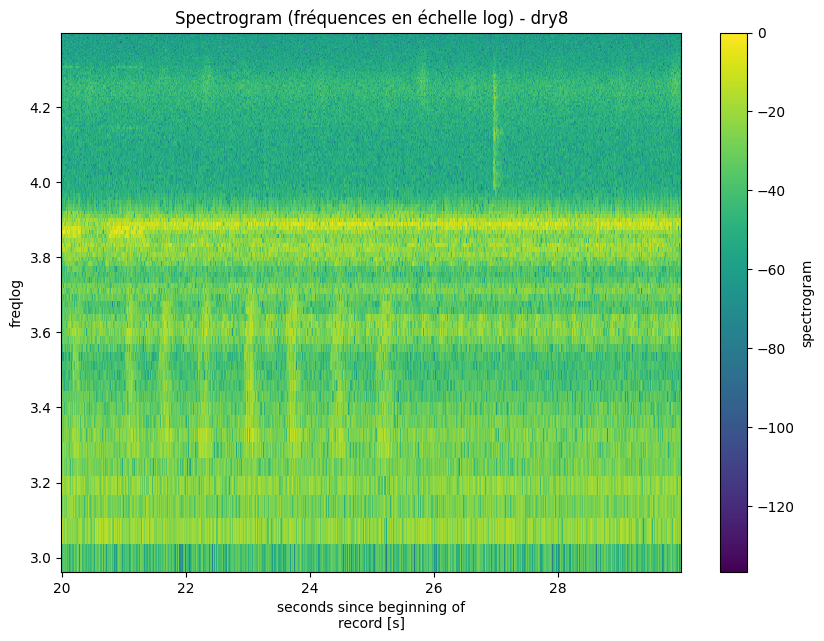

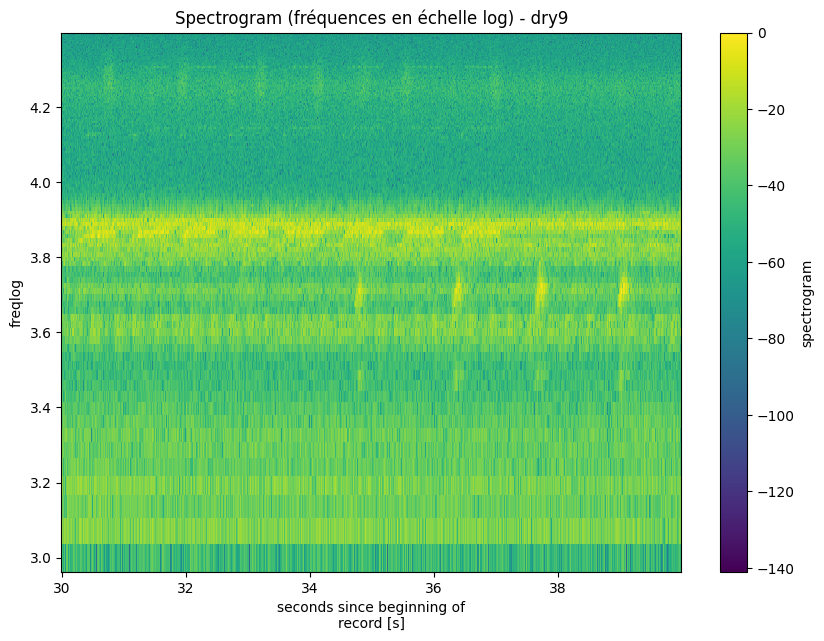

In [82]:
# Visualization by category
categ = "dry" #"noisy_rain"
for i in range(len(fpaths_by_cat[categ])):
    if i<0:
        continue
    if i>=10:
        break
    fpath = fpaths_by_cat[categ][i]
    ds_spec = xr.open_dataset(fpath)

    print(f'file path : {fpath}')
    #display(ds_spec)


 
   # Let's quickly visualize with a log-scale
    fig = plt.figure(figsize=(10, 7))
    z =(10*np.log10(ds_spec.spectrogram/ds_spec.spectrogram.max()))
    z["freqlog"] = np.log10(1e3+z["frequency"])
    z.plot(x="time",y="freqlog")
    ax = plt.gca()
    ax.set_title('Spectrogram (fréquences en échelle log) - ' + categ + str(i))

plt.show()
    